# Exploation_08

## 1. Camera_Sticker

### 1.1 모듈

- 흥미로운 것을 설치합니다...

In [2]:
!pip install mediapipe

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 32.8 MB 1.1 MB/s 


- import할 라이브러리를 보기 편하게 모아놓습니다.

In [3]:
import os
import cv2
import matplotlib.pyplot as plt
import math
import numpy as np
import dlib
import mediapipe as mp
from google.colab import drive
from google.colab import files
from google.colab.patches import cv2_imshow

- 물론 구글 드라이브도 활용합니다.

In [ ]:
drive.mount('/gdrive')

Mounted at /gdrive


### 1.2 함수

#### 1.2.1 face_landmark

- 하나하나 치려니까 손이 많이 가길래 이미지를 불러서 landmark까지 찍어주는 코드를 묶었습니다.

In [ ]:
def face_landmark(img_path):
    img_bgr = cv2.imread(img_path)    # OpenCV로 이미지를 불러옵니다
    img_bgr = cv2.resize(img_bgr, dsize=(0, 0), fx=0.4, fy=0.4, interpolation=cv2.INTER_LANCZOS4)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다

    dlib_rects = detector_hog(img_rgb, 1)

    for dlib_rect in dlib_rects:
        l = dlib_rect.left()
        t = dlib_rect.top()
        r = dlib_rect.right()
        b = dlib_rect.bottom()

        cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)

    img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)

    list_landmarks = []

    # 얼굴 영역 박스 마다 face landmark를 찾아냅니다
    for dlib_rect in dlib_rects:
        points = landmark_predictor(img_rgb, dlib_rect)
        # face landmark 좌표를 저장해둡니다
        list_points = list(map(lambda p: (p.x, p.y), points.parts()))
        list_landmarks.append(list_points)

    # print('landmark 개수 : ', len(list_landmarks[0]))


    for landmark in list_landmarks:
        for point in landmark:
            cv2.circle(img_show, point, 2, (0, 255, 255), -1)

    img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
    plt.imshow(img_show_rgb)
    plt.show()

### 1.3 Image

#### 1.3.1 Image load

- 참고로 불러올 이미지는 (https://generated.photos/) 에서 가져온 AI가 합성한 얼굴입니다.  
저작권은 저작자 표시를 하는 조건으로 비상업적 용도에서 무료입니다.
- google drive에 인물 이미지를 넣고 불러오겠습니다.

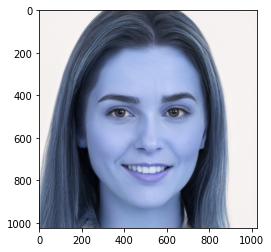

In [ ]:
my_image_path = '/gdrive/My Drive/Colab Notebooks/data/camera_sticker/images/people/099657.jpg'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
plt.imshow(img_bgr)
plt.show()

- OpenCV는 이미지를 RGB로 처리하는게 아니라 BGR로 처리합니다.  
cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)를 넣어 RGB로 바꿔줍니다.

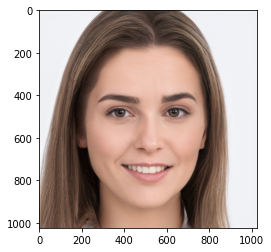

In [ ]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

- AI가 만든 얼굴인데 이쁘네요...

#### 1.3.2 Face detection

- 이제 얼굴 영역을 뽑아내기 위해 dlib의 face_detector를 선언합니다.

In [ ]:
detector_hog = dlib.get_frontal_face_detector()

- 코드를 보고있는데 detector_hog에서 'hog'가 무엇일지 궁금함이 몰려와 찾아봅니다.
- HOG는 Histogram of oriented Gradients로 선형 SVM 알고리즘을 사용하며, 물체감지에도 널리 사용됩니다.  
자세한 내용은 아래 링크로 확인할 수 있습니다.  
https://medium.com/mlcrunch/face-detection-using-dlib-hog-198414837945

In [ ]:
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)

- 바로 얼굴 영역을 뽑아봅니다.

cv2.rectangle

rectangles[[(233, 357) (788, 911)]]


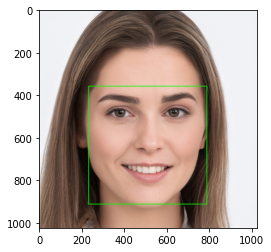

In [ ]:
print(dlib_rects)   

for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()

    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)

img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

- 아주 깔끔하게 얼굴의 이마를 제외하고 뽑아냅니다.

- 자, 우리 목표는 얼굴 이미지에 스티커를 붙이는 겁니다.  
'대충 사진을 보고 550x580 즈음에 붙여야겠다.' 이럴 순 없습니다.  
얼굴의 좌표를 찾아봐야겠습니다.

#### 1.3.3 Face Landmark

1) pretrained_model

- 일단 face의 landmark값을 찍기 위해서 이미 훈련된 model을 사용해야 합니다.  
dlib에서 제공하는 300-W 데이터셋으로 학습한 모델을 가져옵니다.  

In [ ]:
model_path = '/gdrive/My Drive/Colab Notebooks/data/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)

2) find landmarks

- landmark 값을 넣을 리스트를 만들어주고 for문으로 찾아 저장합니다.

In [ ]:
list_landmarks = []

for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

68


- landmarks는 68개입니다.

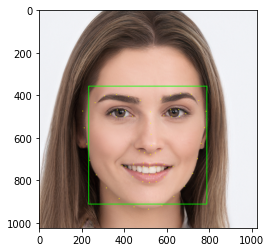

In [ ]:
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 2, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

- 작은 초록색 점이 보이시나요? 안보이실 것 같아 다른 색으로 크기도 키워서 찍어봅니다.
- BGR (0, 255, 255) -> (0, 0, 255) BGR입니다. RGB 아닙니다.
- point size (2 -> 5)

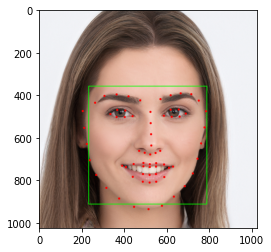

In [ ]:
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 5, (0, 0, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

- 잘 보입니다.

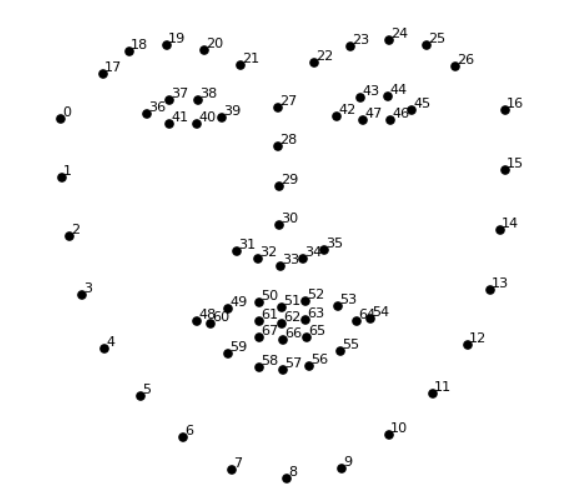

In [113]:
insert_img = '/gdrive/My Drive/Colab Notebooks/data/camera_sticker/images/people/landmark.png'
insert_img = cv2.imread(insert_img)
cv2_imshow(insert_img)

- landmark[30]은 콧대의 하단부분이고 얼굴의 중앙 정도로 보입니다.

In [ ]:
for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30])
    x = landmark[30][0]
    y = landmark[30][1]
    h = dlib_rect.height()
    w = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))

(527, 636)
(x,y) : (527,636)
(w,h) : (556,555)


- landmark[30][0]으로 x, landmark[30][1]으로 y 좌표를 뽑아낼 수 있습니다.
- h와 w에는 추가할 스티커의 비율을 맞춰주기 위해 landmark detection한 범위를 넣어줍니다.

#### 1.3.4 Sticker

- Sticker로 사용할 이미지를 불러옵니다. 고양이 수염입니다.

- cv2.INTER_LANCZOS4 정리

In [ ]:
sticker_path = '/gdrive/My Drive/Colab Notebooks/data/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h), interpolation=cv2.INTER_LANCZOS4)
print (img_sticker.shape)

(555, 556, 3)


- 자, 여기서 고려할 부분이 생깁니다.  
우리가 landmark 위치는 잘 잡았습니다만, 여기에 스티커를 붙이면 아래 사진처럼 됩니다.  
계산을 안하고 넣으면 입술의 중간 부분에 스티커의 left, top의 시작 부분이 그대로 들어갑니다.  
그래서 refined_x, y에 위치를 계산해 넣어줍니다.

- 이미지 들어갈 자리

In [ ]:
refined_x = x - w // 2
refined_y = y - h // 2
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

(x,y) : (249,359)


스티커의 (249,359) 좌표가 landmark[30] 위치(527,636)에 올 수 있도록 자리를 잡아줍니다.

In [ ]:
sticker_area = img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
print(sticker_area.shape)

(555, 556, 3)


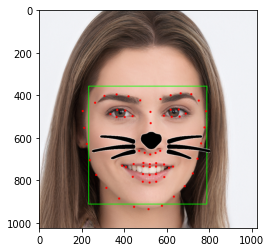

In [ ]:
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

- 아주 깔끔하게 잘 올라왔습니다.

#### 1.3.5 Rotate

- '끝입니다.' 라고 하기엔 허전합니다. 잘 정제된 정면 사진을 가지고 스티커를 붙였습니다.  
만일 사진의 얼굴이 비스듬하다면?

- 적절한 사진을 찾아봅니다.
- 이번 인물사진은 Pixabay.com에서 가져왔으며, 무료 사용이 가능하고 저작자 표시는 필요하지 않습니다.  
https://pixabay.com/service/license/

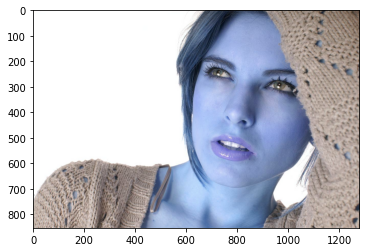

In [ ]:
my_image_path = '/gdrive/My Drive/Colab Notebooks/data/camera_sticker/images/people/people_09.jpg'
img_bgr = cv2.imread(my_image_path)   
img_show = img_bgr.copy()      
plt.imshow(img_bgr)
plt.show()

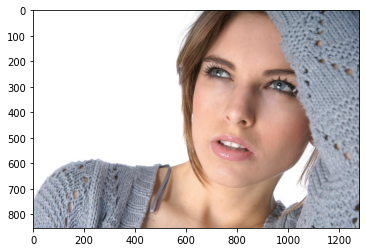

In [ ]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

- 얼굴이 약 20도 정도 비스듬하게 기울어져 있음을 확인할 수 있습니다.  
이미 앞단에 진행한 부분들은 빠르게 넘깁니다.

In [ ]:
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)

rectangles[[(541, 172) (1096, 726)]]


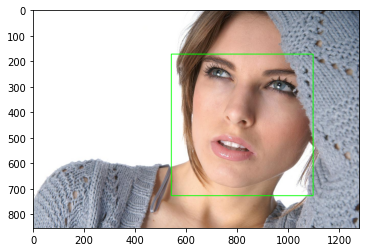

In [ ]:
print(dlib_rects)   

for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()

    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)

img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

In [ ]:
list_landmarks = []

for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

68


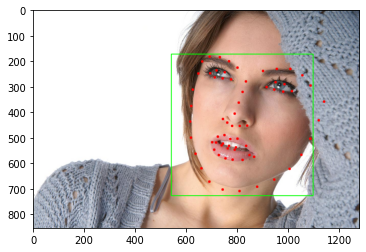

In [ ]:
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 5, (0, 0, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

In [ ]:
for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30])
    x = landmark[30][0]
    y = landmark[30][1]
    h = dlib_rect.height()
    w = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))

(789, 405)
(x,y) : (789,405)
(w,h) : (556,555)


- 잘 잡아냈습니다.

- 다시 스티커를 불러와서 사이즈를 맞춰줍니다.

In [ ]:
sticker_path = '/gdrive/My Drive/Colab Notebooks/data/camera_sticker/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h), interpolation=cv2.INTER_LANCZOS4)
print (img_sticker.shape)

(555, 556, 3)


- 우리는 얼굴이 기울어진 각도를 구해야합니다.  
저는 콧대를 이용해 구해보겠습니다 콧대의 상단과 하단의 직선 기울기 이용해 각도를 구합니다.

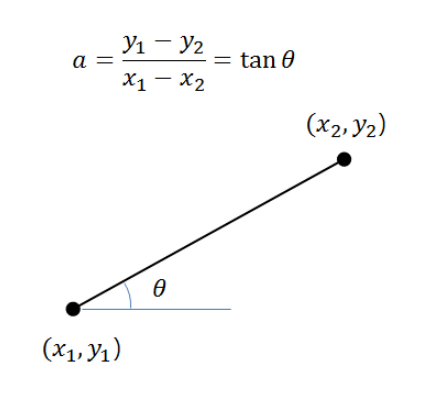

In [114]:
insert_img_2 = '/gdrive/My Drive/Colab Notebooks/data/camera_sticker/images/people/camera_1.png'
insert_img_2 = cv2.imread(insert_img_2)
cv2_imshow(insert_img_2)

- 여기다가 180/pi를 해주면 우리가 아는 그 각도를 구할 수 있습니다.  
호도법에 대한 내용을 남깁니다.  
https://namu.wiki/w/%ED%98%B8%EB%8F%84%EB%B2%95

- landmark 2개의 좌표가 필요합니다.  
콧대 상단 : [27]  
콧대 하단 : [30]

In [ ]:
x1 = landmark[30][0]
x2 = landmark[27][0]
y1 = landmark[30][1]
y2 = landmark[27][1]
print ('30번 : (%d,%d)'%(x1,y1))
print ('27번 : (%d,%d)'%(x2,y2))

gradient = ((x1-x2)/(y1-y2))
gradient = np.arctan(gradient)
angle = gradient *180/math.pi
print(angle)

30번 : (789,405)
27번 : (833,279)
-19.24952587268173


- 위와 같이 계산을 마칩니다.

- OpenCV에서는 getRotationMatrix2D를 이용해 회전을 지원합니다.  
getRotationMatrix2D는 이미지의 센터, 각도, 확대 비율이 들어갑니다.  
센터값은 shape으로 x, y 값을 /2 해서 구하고, angle은 위에서 구한 값을 사용합니다.   
확대는 이미지를 불러오면서 이미 했으므로 넘어갑니다.

- cv2.warpAffine로 이미지를 shift해줍니다.  
cv2.warpAffine(src, M, dsize, dst=None, flags=None, borderMode=None, borderValue=None)  
• src: 입력 영상  
• M: 2x3 어파인 변환 행렬. 실수형  
• dsize: 결과 영상 크기 (w, h) 튜플 (0, 0)이면 src와 같은 크기로 설정  
• dst: 출력 영상  
• flags: 보간법으로 기본값은 cv2.INTER_LINEAR  
• borderMode: 가장자리 픽셀 확장 방식. 기본값은 cv2.BORDER_CONSTANT  
• borderValue: cv2.BORDER_CONSTANT일 때 사용할 상수 값. 기본값은 0(검정색)  

- warpaffine에 대해 잘 설명해주는 사이트입니다.  
https://theailearner.com/tag/cv2-warpaffine/

In [ ]:
img_center = (img_sticker.shape[1] / 2, img_sticker.shape[0] / 2)
rotate_img = cv2.getRotationMatrix2D(img_center, angle, 1.0)
img_sticker = cv2.warpAffine(img_sticker, rotate_img, (0,0), flags=cv2.INTER_LINEAR,borderValue=(255,255,255))

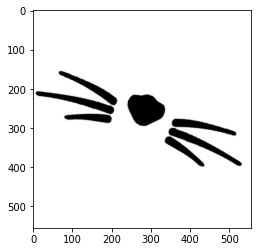

In [ ]:
plt.imshow(img_sticker)
plt.show()

In [ ]:
refined_x = x - w // 2
refined_y = y - h // 2
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

(x,y) : (511,128)


In [ ]:
sticker_area = img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
print(sticker_area.shape)

(555, 556, 3)


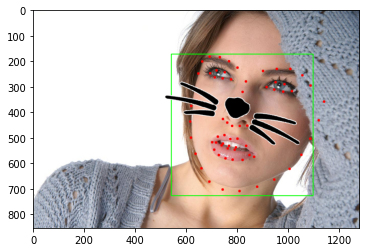

In [ ]:
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

- 잘 돌아갔습니다. 이정도면 훌륭한 것 같습니다.

## 2. Mediapipe

### 2.1 Face Mesh

#### 2.1.1 Image load

- face detection을 알아보다가 재미있는 mediapipe를 찾았습니다.  
- 아주 편리하게 구글 코랩으로 사용법도 알려줍니다.  
이미 위에서 모듈 import 하기 전에 설치도 마쳤으니 바로 이미지를 업로드해서 사용해봅니다.
- 가이드로 제공하는 코드에 로컬에서 바로 올리게끔 해놨으니 이용해봅니다.

In [4]:
uploaded = files.upload()

Saving people_05.jpg to people_05.jpg


- 업로드한 이미지를 opencv로 read합니다.

people_05.jpg


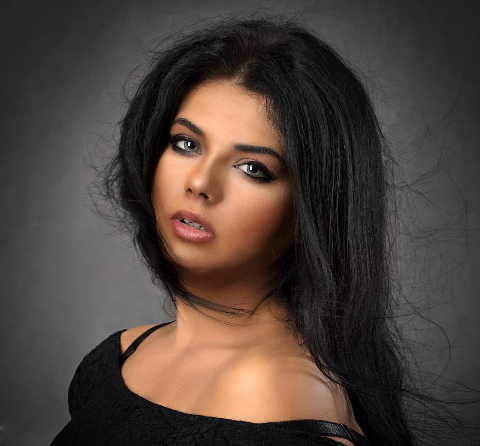

In [ ]:
DESIRED_HEIGHT = 480
DESIRED_WIDTH = 480
def resize_and_show(image):
  h, w = image.shape[:2]
  if h < w:
    img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
  else:
    img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
  cv2_imshow(img)

# Read images with OpenCV.
images = {name: cv2.imread(name) for name in uploaded.keys()}
# Preview the images.
for name, image in images.items():
  print(name)   
  resize_and_show(image)

- 잘 가져옵니다.

#### 2.1.2 Drawing utils

- mediapipe face mesh 솔루션을 불러오고 drawing utils을 준비합니다.

In [ ]:
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils 
mp_drawing_styles = mp.solutions.drawing_styles

#### 2.1.3 Landmark mapping

- mp_face_mesh.FaceMesh의 옵션을 살펴봅니다.
  - static_image_mode : false면 비디오스트림으로 처리
  - max_num_faces : 최대 얼굴 수
  - refine_landmarks : 눈과 입술 주변의 랜드마크 좌표 세분화, 홍채 주변 추가 랜드마크 출력여부
  - min_detection_confidence : 0.0~1.0사이 값으로 얼굴 탐지 모델의 최소 신뢰 값

- 일단 기본 코드의 default값을 씁니다.

Face landmarks of people_05.jpg:


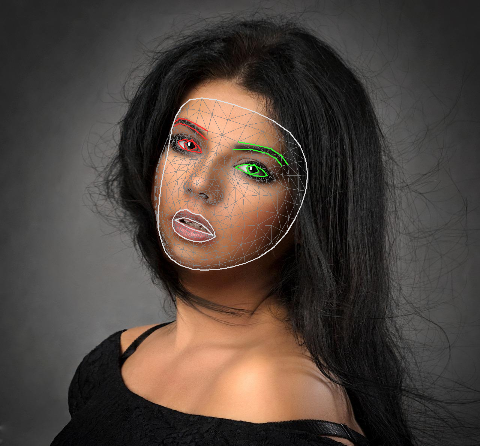

In [ ]:
with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    refine_landmarks=True,
    max_num_faces=1,
    min_detection_confidence=0.5) as face_mesh:
  for name, image in images.items():
    # Convert the BGR image to RGB and process it with MediaPipe Face Mesh.
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Draw face landmarks of each face.
    print(f'Face landmarks of {name}:')
    if not results.multi_face_landmarks:
      continue
    annotated_image = image.copy()
    for face_landmarks in results.multi_face_landmarks:
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_TESSELATION,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_tesselation_style())
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_CONTOURS,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_contours_style())
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_IRISES,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_iris_connections_style())
    resize_and_show(annotated_image)

- 얼굴 윤곽까지 정교하게 매핑해줍니다.

- landmark를 표시하려합니다.  
문제는 dlib의 landmark처럼 친절하게 숫자로 맵을 그려놓은 이미지를 찾기 어렵습니다.  
있으나 468개가 빼곡하게 몰려있어 알아보기가 힘듭니다.

- 일단 for문을 돌려 landmark를 표시해줍니다.

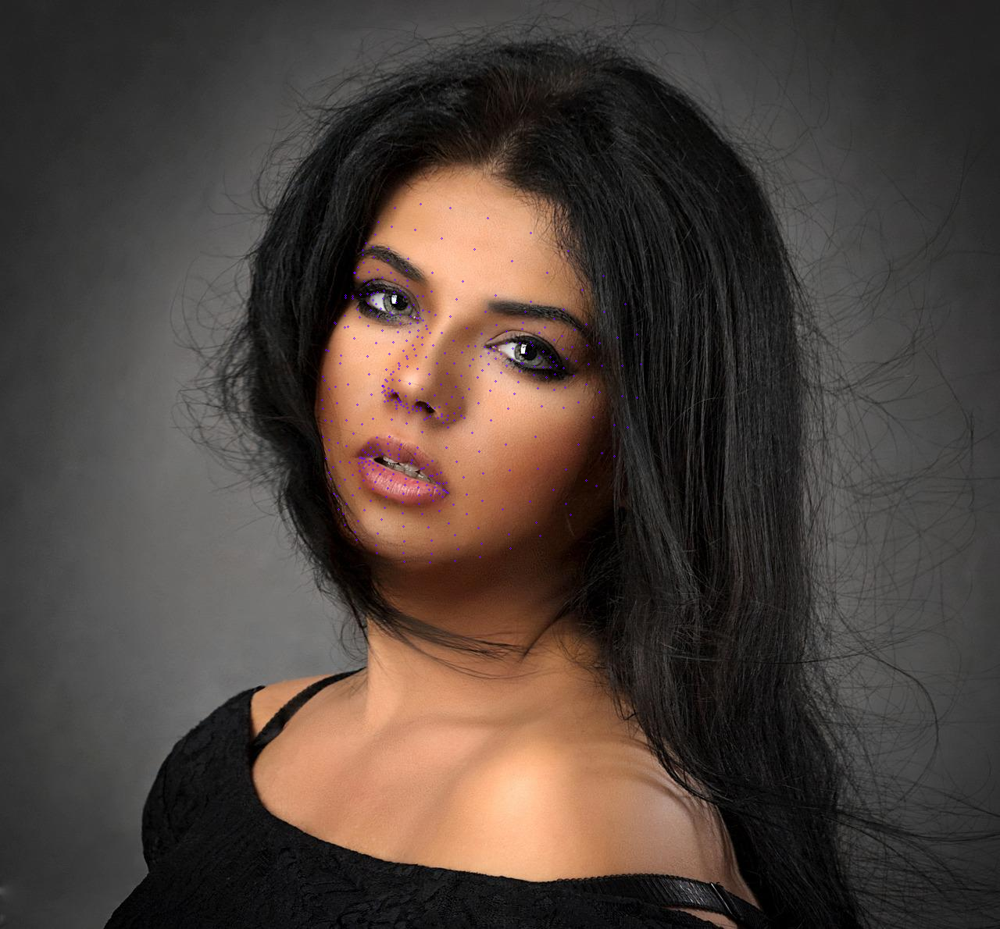

In [ ]:
for face in results.multi_face_landmarks:
    for landmark in face.landmark:
        x = landmark.x
        y = landmark.y

        shape = image.shape 
        relative_x = int(x * shape[1])
        relative_y = int(y * shape[0])

        cv2.circle(image, (relative_x, relative_y), radius=1, color=(255, 0, 100), thickness=1)
        x1 = results.multi_face_landmarks[0].landmark[0].x
        y1 = results.multi_face_landmarks[0].landmark[0].y
        relative_x1 = int(x1 * shape[1])
        relative_y1 = int(y1 * shape[0])

cv2_imshow(image)

- 우리가 보는 방향으로 얼굴의 우측부분이 더 넓게 잡힌 것 같지만 매우 양호합니다.

#### 2.1.4 Sticker

- 그냥 landmark만 따면 재미 없으니 landmark를 활용해봅니다.  
- 아내의 유혹의 '민소희 점'을 찍어봅니다(아래 사진 참고)

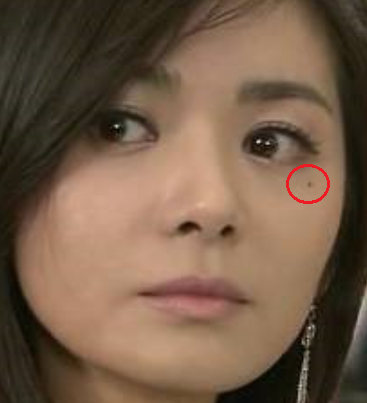

In [115]:
insert_img_3 = '/gdrive/My Drive/Colab Notebooks/data/camera_sticker/images/people/point_12.png'
insert_img_3 = cv2.imread(insert_img_3)
cv2_imshow(insert_img_3)

- 우리의 시선에서 우측 눈 하단의 자리를 찾기위해 이리저리 찍어보고 크기도 키워보고 수차례 츄라이를 했습니다.  
(468개라 매핑가이드를 봐도 숫자가 겹쳐보여 찾기 힘듭니다)
- 아래 이미지는 그 과정의 결과물입니다...

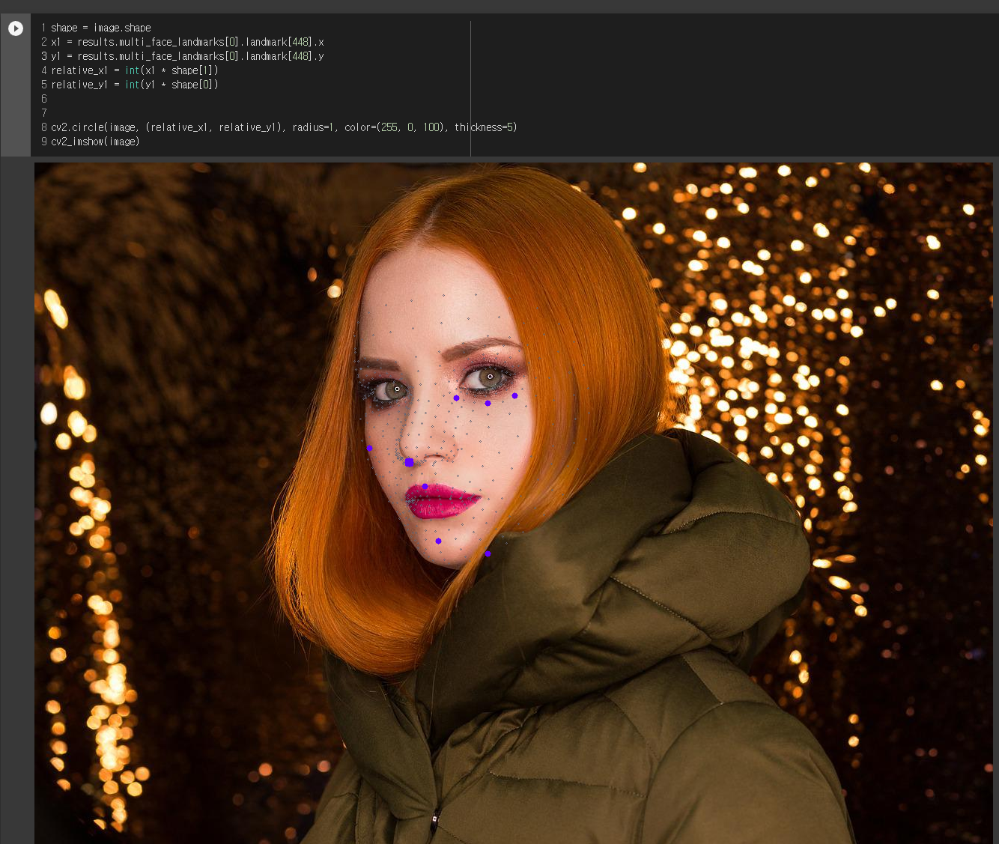

In [116]:
insert_img_4 = '/gdrive/My Drive/Colab Notebooks/data/camera_sticker/images/people/image_55.png'
insert_img_4 = cv2.imread(insert_img_4)
cv2_imshow(insert_img_4)

- 다시 깔끔한 이미지를 불러오고...

In [117]:
uploaded = files.upload()

Saving people_05.jpg to people_05 (9).jpg


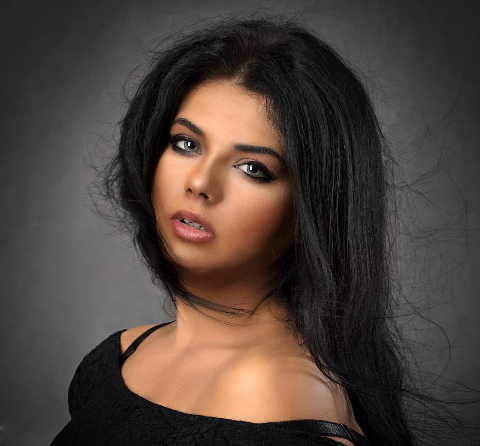

Face landmarks of people_05.jpg:


In [ ]:
DESIRED_HEIGHT = 480
DESIRED_WIDTH = 480
def resize_and_show(image):
  h, w = image.shape[:2]
  if h < w:
    img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
  else:
    img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
  cv2_imshow(img)

# Read images with OpenCV.
images = {name: cv2.imread(name) for name in uploaded.keys()}
# Preview the images.
for name, image in images.items():
  resize_and_show(image)

mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils 
mp_drawing_styles = mp.solutions.drawing_styles

with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    refine_landmarks=True,
    max_num_faces=2,
    min_detection_confidence=0.5) as face_mesh:
  for name, image in images.items():
    # Convert the BGR image to RGB and process it with MediaPipe Face Mesh.
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Draw face landmarks of each face.
    print(f'Face landmarks of {name}:')
    if not results.multi_face_landmarks:
      continue
    annotated_image = image.copy()
    for face_landmarks in results.multi_face_landmarks:
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_TESSELATION,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_tesselation_style())
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_CONTOURS,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_contours_style())
      mp_drawing.draw_landmarks(
          image=annotated_image,
          landmark_list=face_landmarks,
          connections=mp_face_mesh.FACEMESH_IRISES,
          landmark_drawing_spec=None,
          connection_drawing_spec=mp_drawing_styles
          .get_default_face_mesh_iris_connections_style())

- 448번 자리에 BGR(0, 40, 80) 짙은 갈색계열 점을 똿! 찍어버립니다.

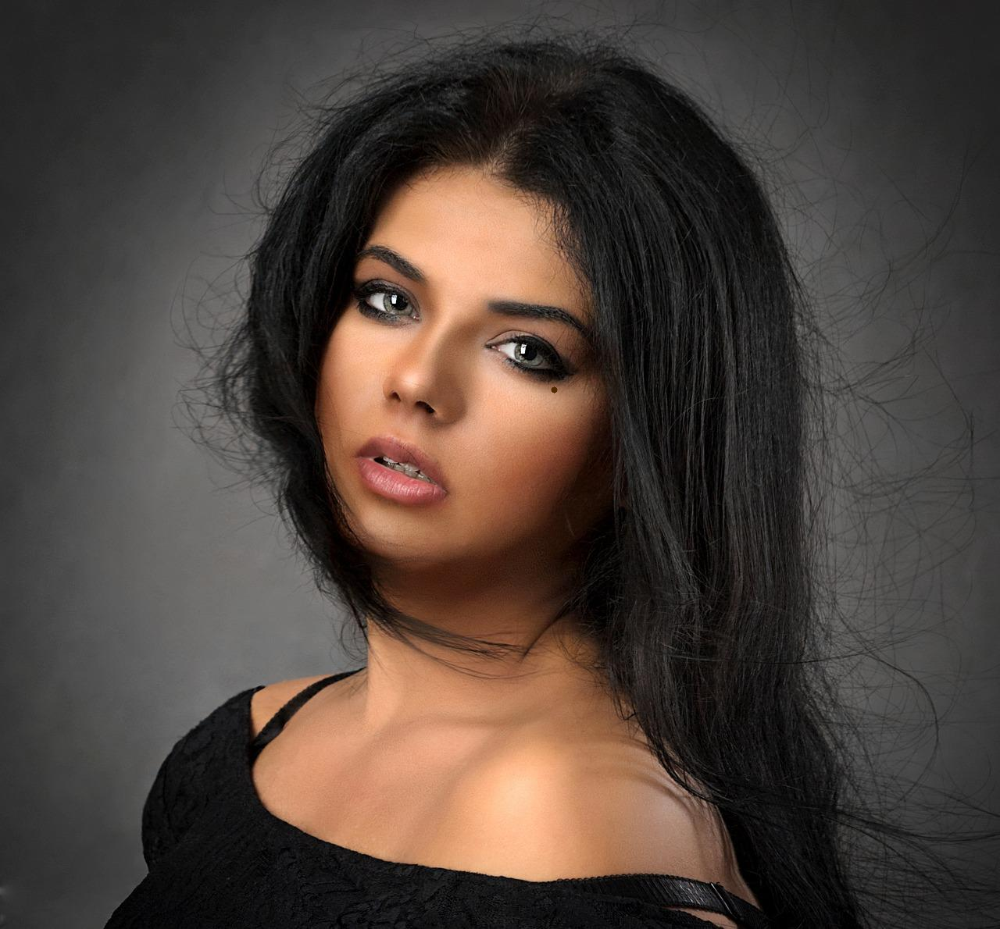

In [ ]:
shape = image.shape 
x1 = results.multi_face_landmarks[0].landmark[448].x
y1 = results.multi_face_landmarks[0].landmark[448].y
relative_x1 = int(x1 * shape[1])
relative_y1 = int(y1 * shape[0])


cv2.circle(image, (relative_x1, relative_y1), radius=1, color=(0, 40, 80), thickness=5)
cv2_imshow(image)

- 너무 매력적입니다... 어디 계신가요!

- 구릿빛의 피부가 타투랑 잘 어울릴 것 같습니다.  
타투형태의 이미지를 붙여보겠습니다.

In [ ]:
shape = image.shape 

x_h = int(results.multi_face_landmarks[0].landmark[454].x * shape[0])
x_l = int(results.multi_face_landmarks[0].landmark[234].x * shape[0])
y_h = int(results.multi_face_landmarks[0].landmark[152].y * shape[1])
y_l = int(results.multi_face_landmarks[0].landmark[10].y * shape[1])

w = (x_h - x_l)
h = (y_h - y_l)

x_r1 = int(results.multi_face_landmarks[0].landmark[152].x * shape[0])
x_r2 = int(results.multi_face_landmarks[0].landmark[10].x * shape[0])
y_r1 = int(results.multi_face_landmarks[0].landmark[152].y * shape[1])
y_r2 = int(results.multi_face_landmarks[0].landmark[10].y * shape[1])

r_x = int(results.multi_face_landmarks[0].landmark[280].x * shape[0])
r_y = int(results.multi_face_landmarks[0].landmark[280].y * shape[1])

gradient = ((x_r1-x_r2)/(y_r1-y_r2))
gradient_2 = np.arctan(gradient)
angle = (gradient_2 * 180/math.pi)
print(angle)
print(w,h)
print(results.multi_face_landmarks[0].landmark[10])
print(r_x,r_y)
print(x_r1, x_r2, y_r1, y_r2)

-15.97822074953048
333 461
x: 0.487945556640625
y: 0.2351856678724289
z: -0.012894347310066223

637 601
448 580 762 301


- 위치를 잡고 회전시키기 위한 계산의 흔적입니다.

- 타투 느낌의 스티커를 불러옵니다.  
(물론 저작권에서 자유로운 픽사베이에서 가져옵니다)

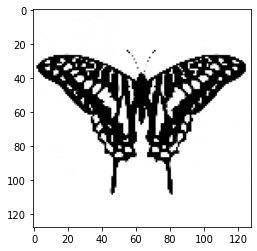

In [ ]:
sticker_path = '/gdrive/My Drive/Colab Notebooks/data/camera_sticker/images/people/tattoo_3.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
# img_sticker = cv2.cvtColor(img_sticker, cv2.COLOR_BGR2RGB)
img_sticker = cv2.resize(img_sticker, (0,0),fx=0.2,fy=0.2, interpolation=cv2.INTER_LINEAR)
plt.imshow(img_sticker)
plt.show()

In [ ]:
img_center = tuple(np.array(img_sticker.shape[1::-1]) / 2)
rotate_img = cv2.getRotationMatrix2D(img_center, angle, 1.0)
img_sticker = cv2.warpAffine(img_sticker, rotate_img, img_sticker.shape[1::-1], flags=cv2.INTER_LINEAR,borderValue=(255,255,255))
# img_sticker = cv2.warpAffine(img_sticker, rotate_img, (0,0), flags=cv2.INTER_LINEAR)

- 회전시킵니다.

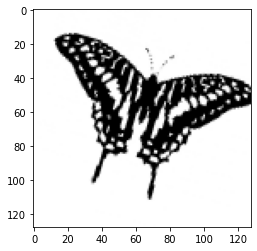

In [ ]:
plt.imshow(img_sticker)
plt.show()

In [ ]:
refined_x = r_x - int(img_center[0])
refined_y = r_y - int(img_center[1])
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

(x,y) : (573,537)


- 붙여버립니다.

In [ ]:
sticker_area = image[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
image[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker<=170,img_sticker, sticker_area).astype(np.uint8)

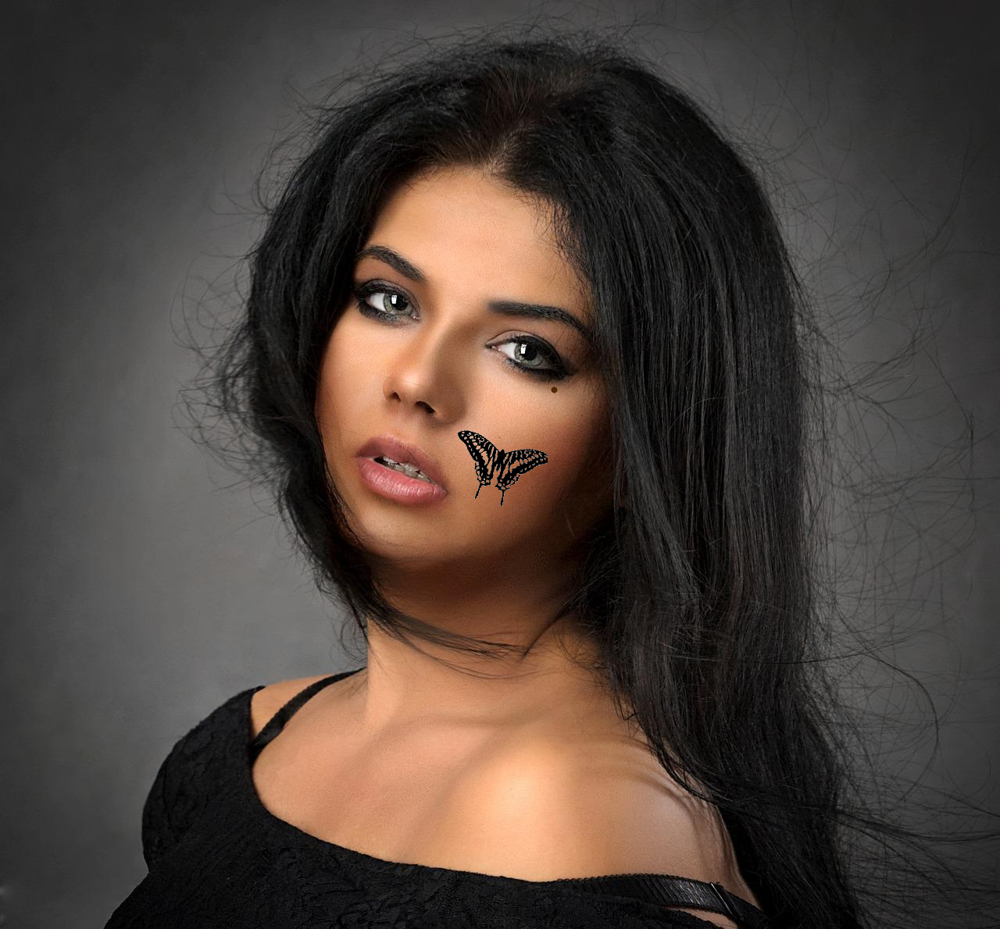

In [ ]:
cv2_imshow(image)

- 크~ 만족스럽네요.

## 3. 회고

#### 1) MediaPipe
- MedaiPipe에 신기한게 많습니다. face detection부터 오늘 사용한 face mesh, eyes tracking이 가능한 Iris,  
신체에 landmark를 찍어 자세를 확인할 수 있는 pose 등 여러가지 솔루션이 있습니다.  
colab으로 사용할 수 있는 예제 형태로도 제공을 하니 잘 활용하면 좋을 것 같습니다.  
https://google.github.io/mediapipe/

#### 2) np.where의 활용
- 마지막에 붙인 나비 형태의 스티커가 깔끔한 투명 png 파일이 아니었습니다.  
img_sticker<=170의 조건 값을 줘서(흰색 255, 검은색 0) 애매한 회색빛 흰색을 제거할 수 있었습니다.  
cv2.threshold라는 간단한 방법도 있으니 참고해서 적용해봐야겠습니다.

#### 3) 좌표계산
- 특히, 스티커를 회전하는 과정에서 계산이 생각보다 껄끄러웠습니다.  
mediapipe의 face mesh의 범위가 비율형태여서 최상단, 최하단, 최우측, 최좌측 점을 찾아서 전체 범위를 구했습니다.  

#### 4) HOG
- 처음에는 선형 SVM 알고리즘을 사용하는 HOG 자체가 신기했는데 이 모델도 2006년에 나온 모델이라고 합니다.  
이후로 object detection은 크게 one-stage와 two-stage로 나뉘며, retina-net, pyramid networks 등 다양한 모델이 등장합니다.  
mainstream에 관심을 가지고 모델을 살펴봐야할 것 같습니다.

## 4. References

- 아래의 사이트에서 많은 도움을 받았습니다.

- https://google.github.io/mediapipe/
- https://medium.com/mlcrunch/face-detection-using-dlib-hog-198414837945
- https://theailearner.com/tag/cv2-warpaffine/
- https://namu.wiki/w/%ED%98%B8%EB%8F%84%EB%B2%95
- https://avocadaon.tistory.com/41
